# Task-3 Graduate Rotational Internship Program (GRIP - APR 22) organised by The Sparks Foundation.

#### Author: Rashmi S (Intern APR 2022)

### Exploratory Data Analysis - Sample Superstore (Retail)

### Aim - To find the areas of development and make insightful decisions for the growth and profit of the company in the future.

### Importing the libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
retail= pd.read_csv("D:/4.  Sparks Internship/SampleSuperstore.csv")

In [4]:
retail.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


### Prerequisites

In [5]:
retail.shape

(9994, 13)

In [6]:
retail.isnull().sum()

Ship Mode       0
Segment         0
Country         0
City            0
State           0
Postal Code     0
Region          0
Category        0
Sub-Category    0
Sales           0
Quantity        0
Discount        0
Profit          0
dtype: int64

In [7]:
retail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


In [8]:
retail.dtypes

Ship Mode        object
Segment          object
Country          object
City             object
State            object
Postal Code       int64
Region           object
Category         object
Sub-Category     object
Sales           float64
Quantity          int64
Discount        float64
Profit          float64
dtype: object

In [9]:
retail.describe()

,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,55190.379428,229.858001,3.789574,0.156203,28.656896
std,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,90008.000000,209.940000,5.000000,0.200000,29.364000
max,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [14]:
retail.nunique()

Ship Mode          4
Segment            3
Country            1
City             531
State             49
Postal Code      631
Region             4
Category           3
Sub-Category      17
Sales           5825
Quantity          14
Discount          12
Profit          7287
dtype: int64

In [7]:
drop=['Postal Code', 'Country']
retail1= retail.drop(columns=drop, axis=1)
retail1.head()

,Ship Mode,Segment,City,State,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,Henderson,Kentucky,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,Henderson,Kentucky,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,Los Angeles,California,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,Fort Lauderdale,Florida,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,Fort Lauderdale,Florida,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


### Data visualization

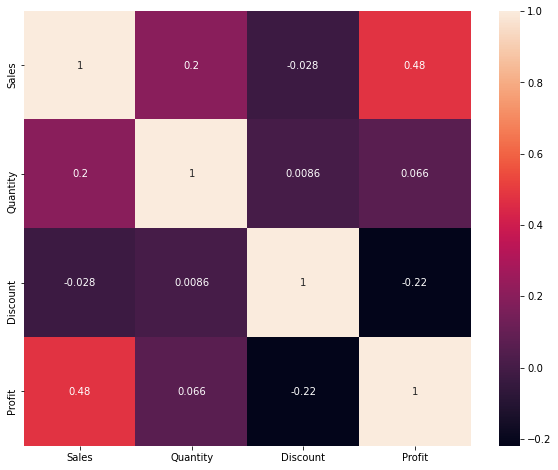

In [8]:
plt.figure(figsize=(10,8))
correlation=retail1.corr()
sns.heatmap(correlation, annot=True)
plt.show()

* We observe a negative correlation between Discount and Profit
* We observe betweeen Sales and Profit, hence the revenue is at good terms

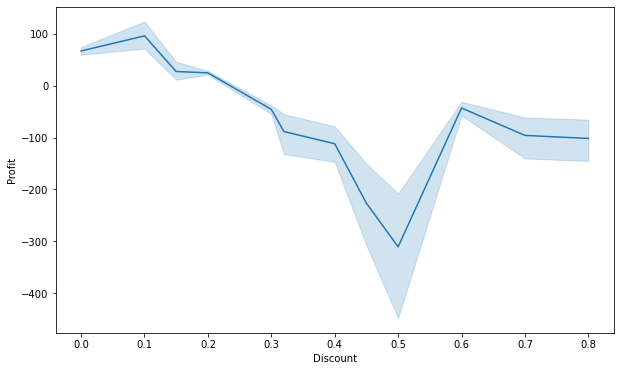

In [9]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Discount', y='Profit', data=retail1)
plt.show()

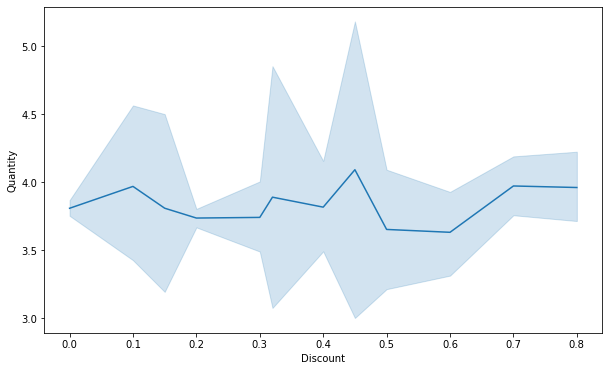

In [10]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Discount', y='Quantity', data=retail1)
plt.show()

In [18]:
# calculating the staewise profit
profit_sum= retail1.groupby("State")["Profit"].sum()
profit_sum

State
Alabama                  5786.8253
Arizona                 -3427.9246
Arkansas                 4008.6871
California              76381.3871
Colorado                -6527.8579
Connecticut              3511.4918
Delaware                 9977.3748
District of Columbia     1059.5893
Florida                 -3399.3017
Georgia                 16250.0433
Idaho                     826.7231
Illinois               -12607.8870
Indiana                 18382.9363
Iowa                     1183.8119
Kansas                    836.4435
Kentucky                11199.6966
Louisiana                2196.1023
Maine                     454.4862
Maryland                 7031.1788
Massachusetts            6785.5016
Michigan                24463.1876
Minnesota               10823.1874
Mississippi              3172.9762
Missouri                 6436.2105
Montana                  1833.3285
Nebraska                 2037.0942
Nevada                   3316.7659
New Hampshire            1706.5028
New Jersey    

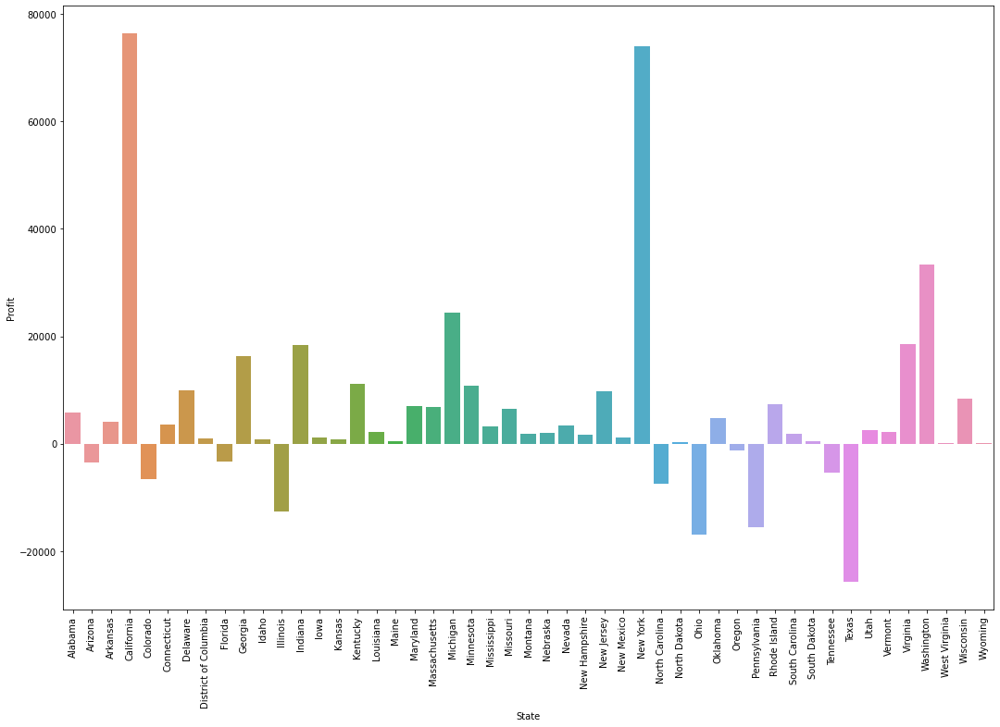

In [19]:
# bar plot
plt.figure(figsize=(18,12))
sns.barplot(x=profit_sum.index, y=profit_sum.values)
plt.ylabel('Profit')
plt.xticks(rotation=90)
plt.show()

* 'California’ makes highest profit henceforth the price margin in this region to be increased inorder to increase sales

* Lowest profit is shown by 'Texas’ henceforth a lot of ground work to be done 


In [20]:
sales_sum= retail1.groupby("State")["Sales"].sum()
sales_sum

State
Alabama                  19510.6400
Arizona                  35282.0010
Arkansas                 11678.1300
California              457687.6315
Colorado                 32108.1180
Connecticut              13384.3570
Delaware                 27451.0690
District of Columbia      2865.0200
Florida                  89473.7080
Georgia                  49095.8400
Idaho                     4382.4860
Illinois                 80166.1010
Indiana                  53555.3600
Iowa                      4579.7600
Kansas                    2914.3100
Kentucky                 36591.7500
Louisiana                 9217.0300
Maine                     1270.5300
Maryland                 23705.5230
Massachusetts            28634.4340
Michigan                 76269.6140
Minnesota                29863.1500
Mississippi              10771.3400
Missouri                 22205.1500
Montana                   5589.3520
Nebraska                  7464.9300
Nevada                   16729.1020
New Hampshire         

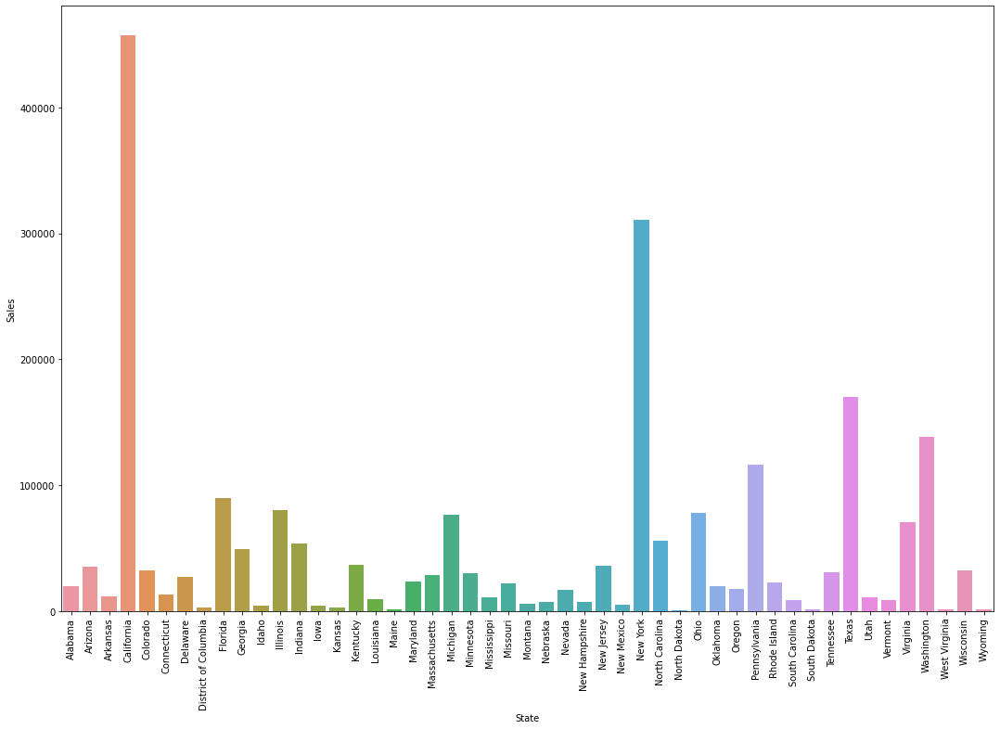

In [27]:
plt.figure(figsize=(18,12))
sns.barplot(x=sales_sum.index, y=sales_sum.values)
plt.ylabel('Sales')
plt.xticks(rotation=90)
plt.show()

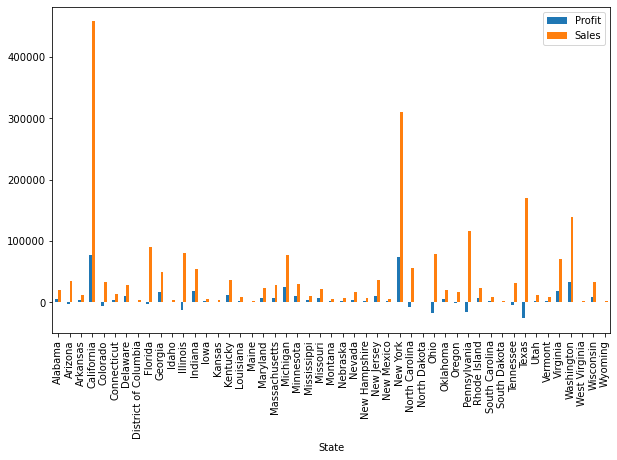

In [12]:
profit_sales = retail1.groupby("State")["Profit", "Sales"].sum()
profit_sales.plot.bar(figsize=(10,6))
plt.show()

Texas Pennsylvania and Ohio have high sales but negative profit

## Category analysis

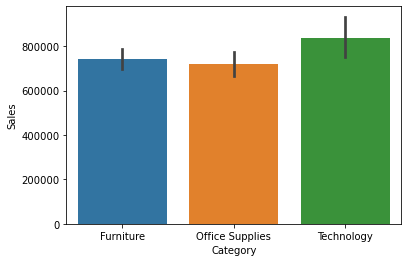

In [36]:
sns.barplot(x='Category', y='Sales', data=retail1, estimator=np.sum)
plt.show()

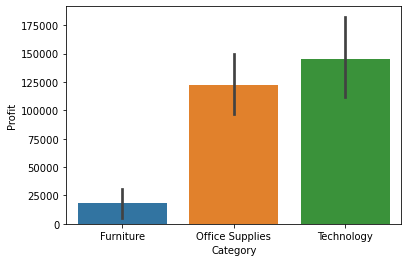

In [35]:
sns.barplot(x='Category', y='Profit', data=retail1, estimator=np.sum)
plt.show()

Ideally technology brings good sales

## Sub category analysis

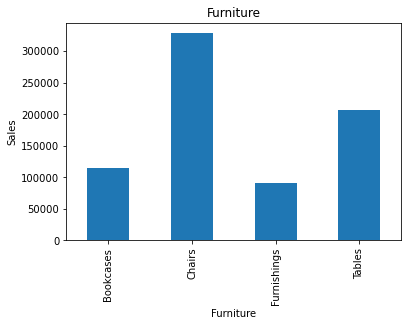

In [13]:
fur= retail1[retail1['Category']=='Furniture'].groupby("Sub-Category")['Sales'].sum()
plt.title("Furniture")
fur.plot.bar()
plt.xlabel("Furniture")
plt.ylabel("Sales")
plt.show()

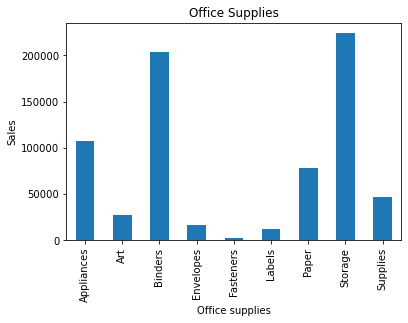

In [21]:
off= retail1[retail1['Category']=='Office Supplies'].groupby("Sub-Category")['Sales'].sum()
plt.title("Office Supplies")
off.plot.bar()
plt.xlabel("Office supplies")
plt.ylabel("Sales")
plt.show()

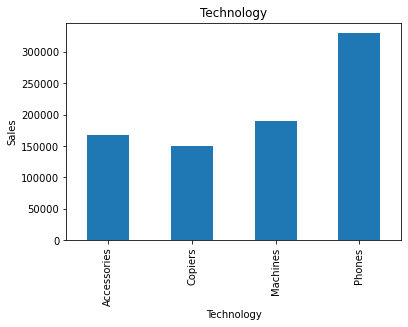

In [22]:
tech= retail1[retail1['Category']=='Technology'].groupby("Sub-Category")['Sales'].sum()
plt.title("Technology")
tech.plot.bar()
plt.xlabel("Technology")
plt.ylabel("Sales")
plt.show()

## Further Analysis

In [28]:
# state wise average discount percent of USA
avg_discount=retail1.groupby('State')['Discount'].mean()*100
avg_discount
s= avg_discount == 0.0
print(len(s))

49


49 states have zero avg discount

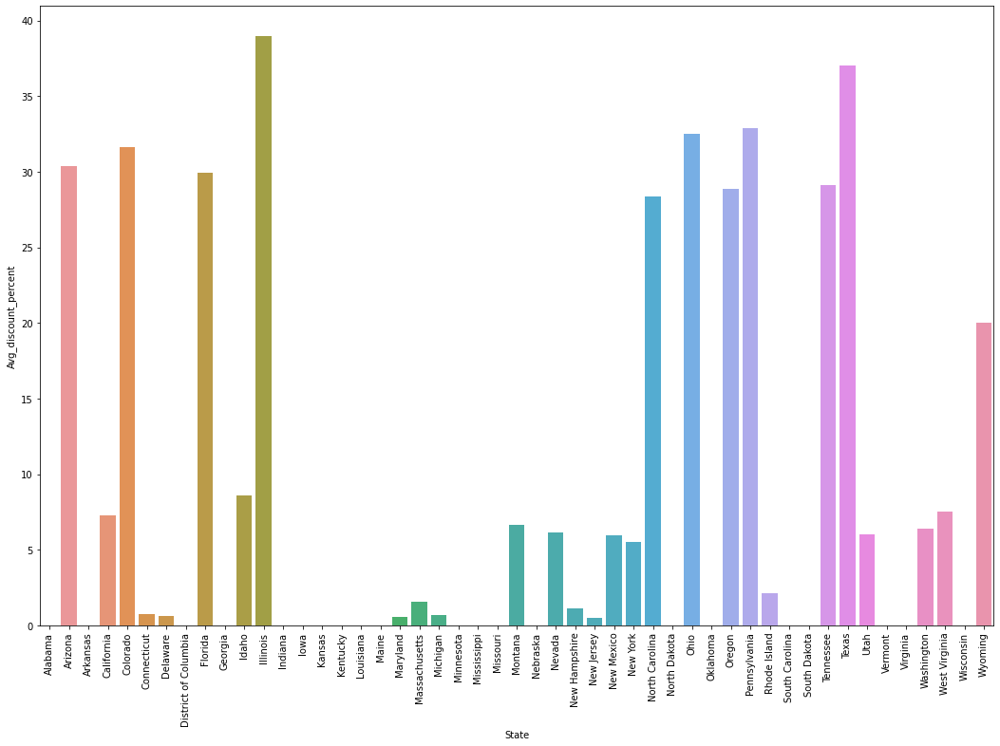

In [25]:
plt.figure(figsize=(18,12))
sns.barplot(x=avg_discount.index, y=avg_discount.values)
plt.ylabel("Avg_discount_percent")
plt.xticks(rotation=90)
plt.show()

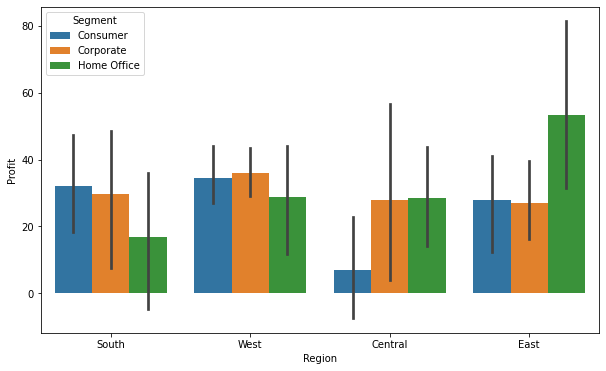

In [32]:
#distribution of profits of segment across different regions
plt.figure(figsize=(10,6))
sns.barplot(data=retail1, x="Region", y='Profit', hue='Segment')
plt.show()

In [ ]:
South = consumer segment
West = Corporate segment
Central= Home office segment
East = Home office segment

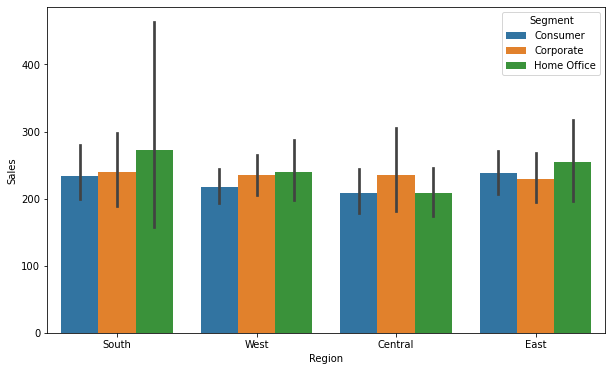

In [76]:
plt.figure(figsize=(10,6))
sns.barplot(data=retail1, x="Region", y='Sales', hue='Segment')
plt.show()

In [11]:
# analyze category wise sales, discount, profit

data=retail1.groupby('Category')[['Sales', 'Discount', 'Profit']].mean()
data

,Sales,Discount,Profit
Category,,,
Furniture,349.834887,0.173923,8.699327
Office Supplies,119.324101,0.157285,20.327050
Technology,452.709276,0.132323,78.752002


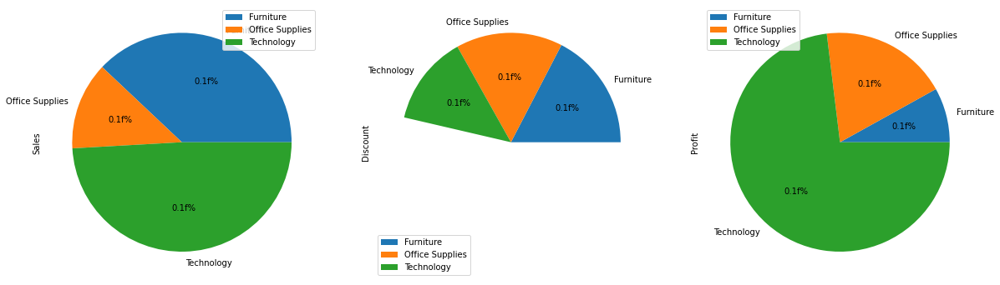

In [14]:
data.plot.pie(subplots=True , figsize=(20,15),autopct="0.1f%%",  labels =data.index)
plt.show()

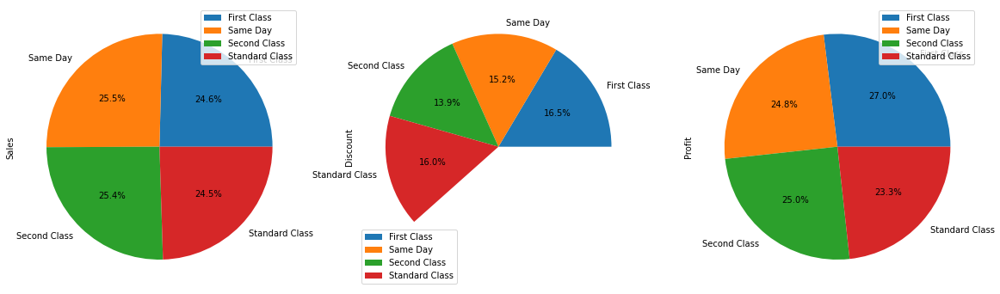

In [15]:
# shipment mode wise sales discount and profit
shipment_data= retail1.groupby('Ship Mode')[['Sales','Discount','Profit']].mean()
shipment_data.plot.pie(subplots=True, figsize=(20,10), autopct="%0.1f%%", labels=shipment_data.index)
plt.show()

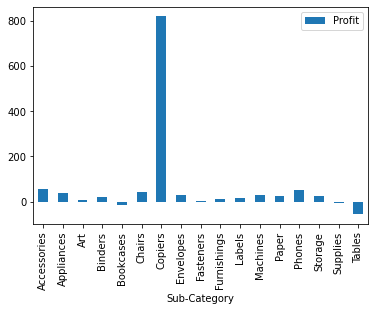

In [17]:
# checking profits of sub - category

sub_cat= pd.pivot_table(retail1, index="Sub-Category",values="Profit")
sub_cat.plot(kind='bar')
plt.show()

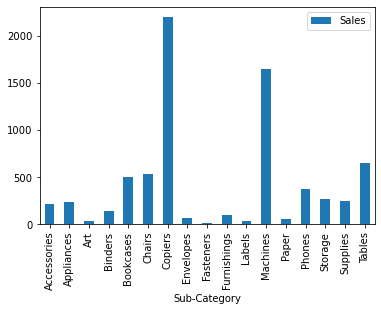

In [26]:
# Sales of sub category
sales1= pd.pivot_table(retail1, index='Sub-Category', values="Sales")
sales1.plot(kind='bar')
plt.show()

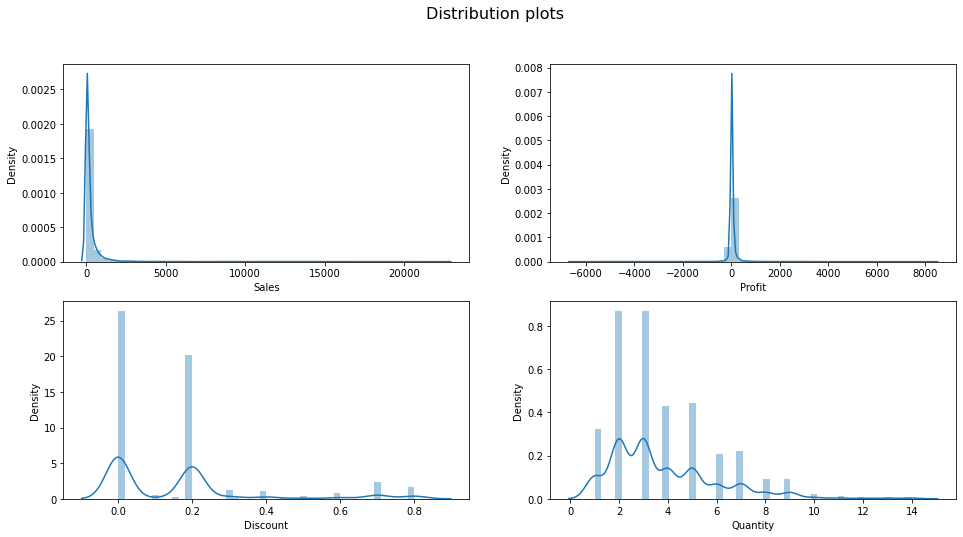

In [31]:
fig,axes = plt.subplots(2,2,figsize=(16,8))
fig.suptitle("Distribution plots", fontsize=16)
sns.distplot(retail1['Sales'],ax=axes[0,0])
sns.distplot(retail1['Profit'],ax=axes[0,1])
sns.distplot(retail1['Discount'],ax=axes[1,0])
sns.distplot(retail1['Quantity'],ax=axes[1,1])
plt.show()

## In depth

In [21]:
numerical_features=[feature for feature in retail1.columns if retail1[feature].dtype!='O']#object =O
print("Number of numercial variables", numerical_features)
retail1[numerical_features].head()

Number of numercial variables ['Sales', 'Quantity', 'Discount', 'Profit']


,Sales,Quantity,Discount,Profit
0,261.9600,2,0.00,41.9136
1,731.9400,3,0.00,219.5820
2,14.6200,2,0.00,6.8714
3,957.5775,5,0.45,-383.0310
4,22.3680,2,0.20,2.5164


In [22]:
# Discrete feature

discrete_feature=[feature for feature in numerical_features if len(retail1[feature].unique())<25]
print("Discrete varaiable count: {}".format(len(discrete_feature)))
retail1[discrete_feature].head()

Discrete varaiable count: 2


,Quantity,Discount
0,2,0.00
1,3,0.00
2,2,0.00
3,5,0.45
4,2,0.20


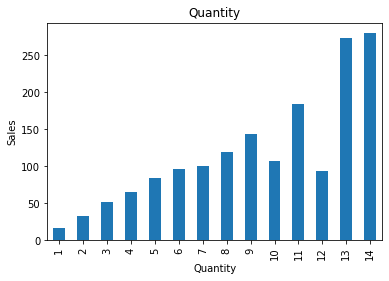

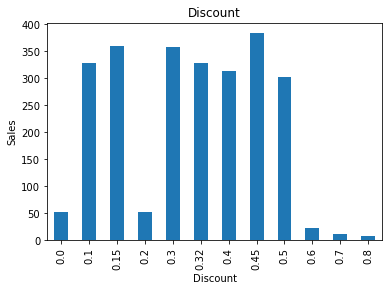

In [23]:
for feature in discrete_feature:
    df3=retail1.copy()
    df3.groupby(feature)['Sales'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel("Sales")
    plt.title(feature)
    plt.show()

In [ ]:
# Continuous variables

In [24]:
continuous_feature = [feature for feature in numerical_features if feature not in discrete_feature]
print("Continous feature count {}".format(len(continuous_feature)))

Continous feature count 2


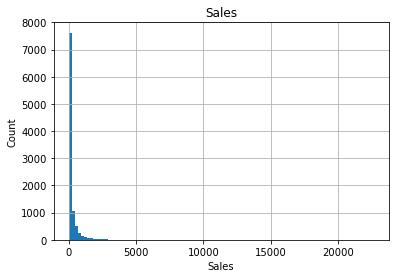

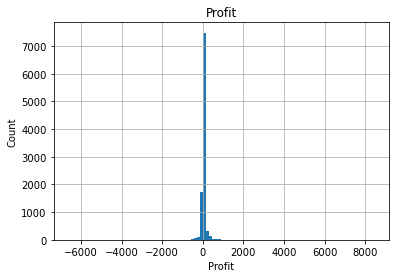

In [27]:
for feature in continuous_feature:
    df=retail1.copy()
    df[feature].hist(bins=100)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

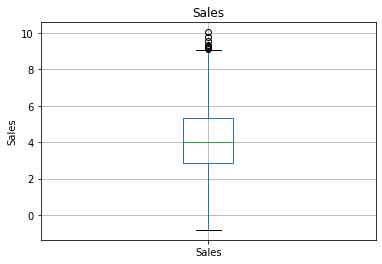

In [29]:
# Outliers

for feature in continuous_feature:
    df= retail1.copy()
    if 0 in df[feature].unique():
        pass
    else:
        df[feature]=np.log(df[feature])
        df.boxplot(column=feature)
       
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

In [ ]:
# Categorical variable

In [33]:
categorical_features = [feature for feature in retail1.columns if retail1[feature].dtypes=='O']
categorical_features

['Ship Mode', 'Segment', 'City', 'State', 'Region', 'Category', 'Sub-Category']

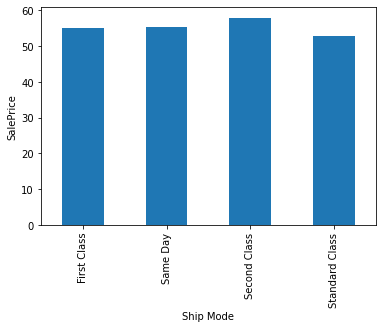

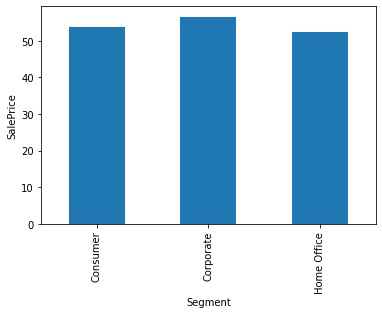

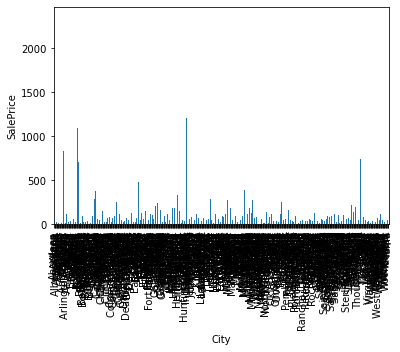

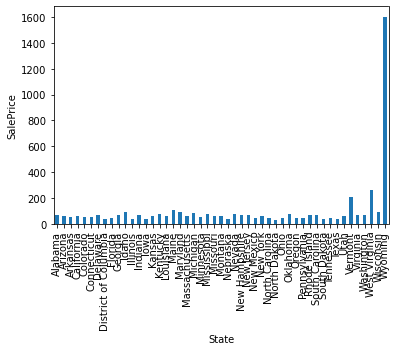

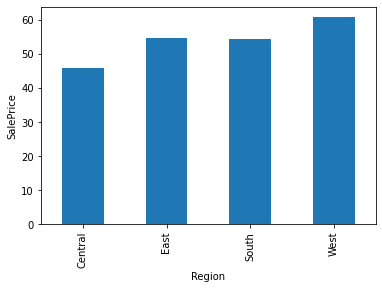

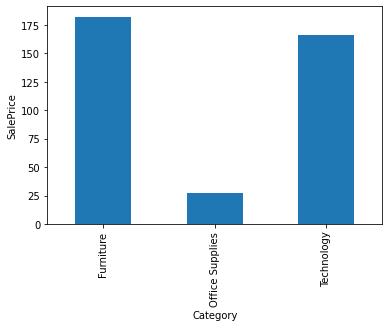

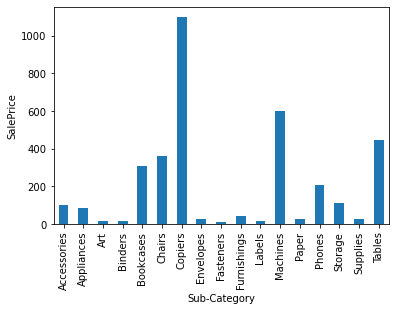

In [36]:
for feature in categorical_features:
    df=retail1.copy()
    df.groupby(feature)['Sales'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel("SalePrice")
    plt.show()

In [ ]:
# Auto emporved EDA

#!pip install autoviz

Alert! from version 0.1.38. After importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
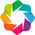

In [37]:
from autoviz.AutoViz_Class import AutoViz_Class
AV=AutoViz_Class()

Shape of your Data Set loaded: (9994, 13)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    13 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 6
Time to run AutoViz = 13 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


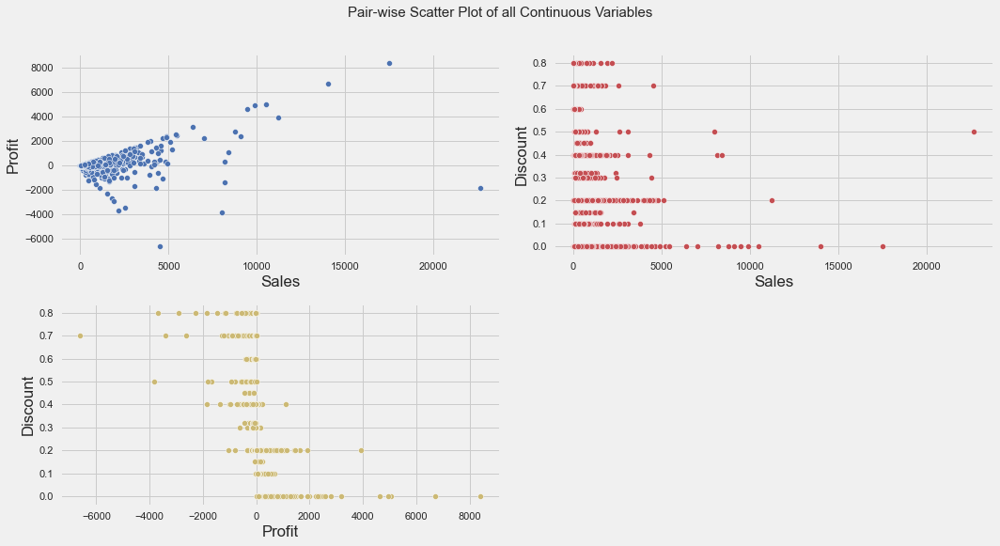

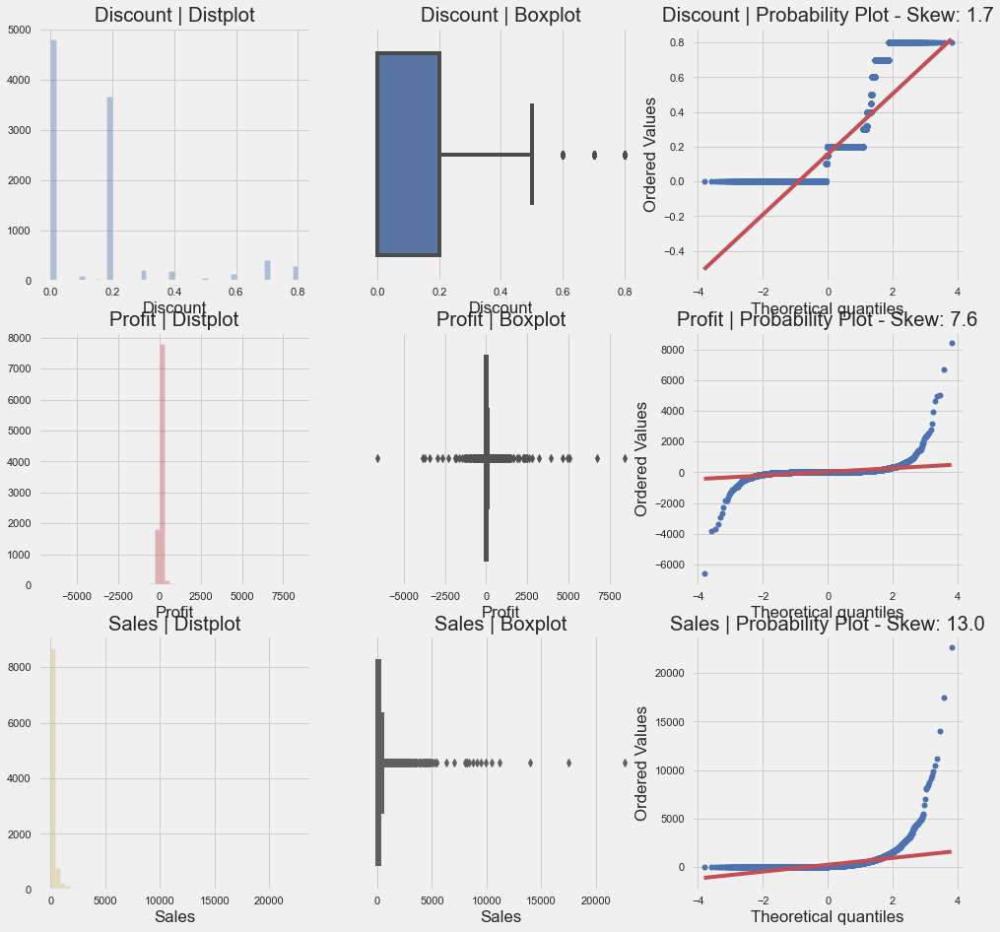

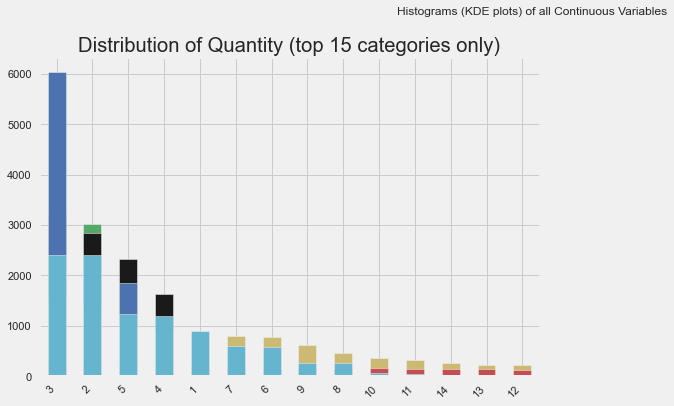

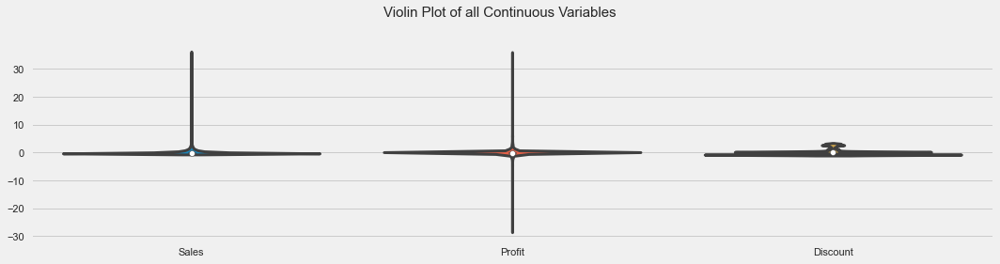

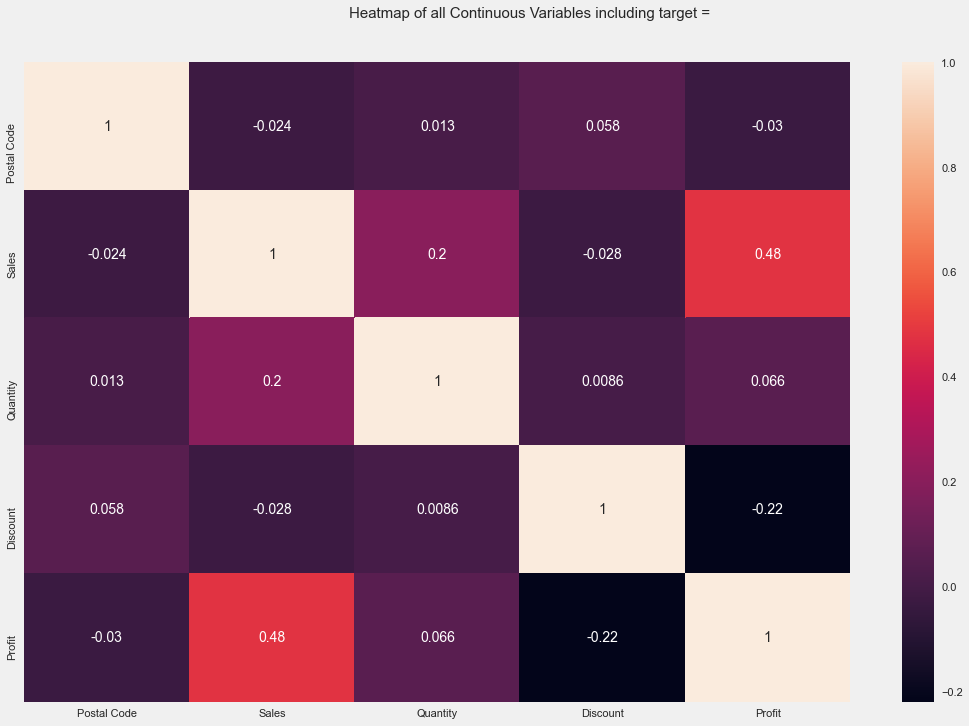

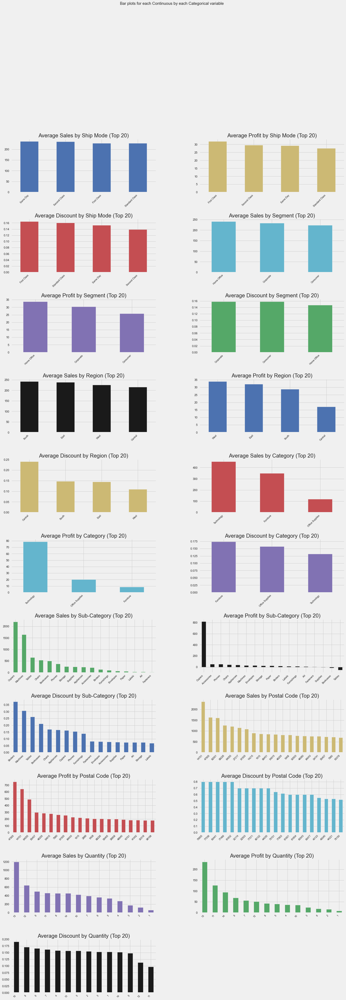

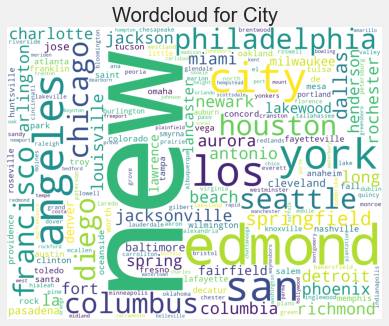

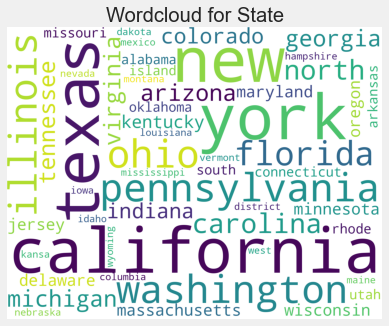

In [38]:
filename ="D:/4.  Sparks Internship/SampleSuperstore.csv"
sep=","
dft=AV.AutoViz(
filename,
sep=",",
depVar="",
dfte=None,
header=0,
verbose=0,
lowess=False,
chart_format="svg",
max_rows_analyzed=150000,
max_cols_analyzed=30,
)

# THANK YOU